In [0]:
!pip install rasterio

In [0]:
from keras.layers import Conv2D, MaxPooling2D, Dropout, Conv2DTranspose, BatchNormalization, Activation, Input
from keras.utils import Sequence
from keras.layers.merge import concatenate, add
from keras.models import Model
from keras.optimizers import Adam
import numpy as np
import pandas as pd
import rasterio
import matplotlib.pyplot as plt
import os

In [0]:
from google.colab import drive
drive.mount('/content/drive')
drive_path = '/content/drive/"My Drive"/spacenet-data/'
image_path_drive = drive_path+'data/'
geojson_path_drive = drive_path+'geojson_roads/'
mask_path_drive = drive_path+'mask/'

In [0]:
def move_data(drive_img_path, drive_mask_path):
  
    if not os.path.exists('img_data'):
        os.makedirs('img_data')
    if not os.path.exists('mask_data'):
        os.makedirs('mask_data')

    image_path = 'img_data'
    mask_path = 'mask_data'
    cpy_image = 'cp ' + drive_img_path + '* '+ image_path
    cpy_mask = 'cp ' + drive_mask_path + '* ' + mask_path

    try:
        print("Copying files...")
        os.system(cpy_image)
        print("Images copied")
        os.system(cpy_mask)
        print("Masks copied")
    except:
        print("Failed copying files")
    else:
        print("Files Copied")
    return image_path+'/', mask_path+'/'

In [0]:
image_path_new, mask_path_new = move_data(image_path_drive, mask_path_drive)

In [0]:
#single block of the unet model
def conv2d_block(input_tensor, n_filters, kernel_size = 3, batchnorm = True):
    # first layer
    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
        kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
        x = Activation('relu')(x)

    # second layer
    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
        kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
        x = Activation('relu')(x)
    return x

In [0]:
#unet model
def get_unet(input_img, n_filters = 16, dropout = 0.1, batchnorm = True):
  
    #test = conv2d_block(input_img, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)
    c1 = Conv2D(filters = n_filters, kernel_size = (6, 6), strides = (1, 1), padding = 'valid')(input_img)
    p1 = MaxPooling2D((2, 2))(c1)
    p1 = Dropout(dropout)(p1)

    c2 = conv2d_block(p1, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)
    p2 = MaxPooling2D((2, 2))(c2)
    p2 = Dropout(dropout)(p2)

    c3 = conv2d_block(p2, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)
    p3 = MaxPooling2D((2, 2))(c3)
    p3 = Dropout(dropout)(p3)

    c4 = conv2d_block(p3, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)
    p4 = MaxPooling2D((2, 2))(c4)
    p4 = Dropout(dropout)(p4)

    c5 = conv2d_block(p4, n_filters = n_filters * 16, kernel_size = 3, batchnorm = batchnorm)

    # Expansive Path
    u6 = Conv2DTranspose(n_filters * 8, (3, 3), strides = (2, 2), padding = 'same')(c5)
    u6 = concatenate([u6, c4])
    u6 = Dropout(dropout)(u6)
    c6 = conv2d_block(u6, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)

    u7 = Conv2DTranspose(n_filters * 4, (3, 3), strides = (2, 2), padding = 'same')(c6)
    u7 = concatenate([u7, c3])
    u7 = Dropout(dropout)(u7)
    c7 = conv2d_block(u7, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)

    u8 = Conv2DTranspose(n_filters * 2, (3, 3), strides = (2, 2), padding = 'same')(c7)
    u8 = concatenate([u8, c2])
    u8 = Dropout(dropout)(u8)
    c8 = conv2d_block(u8, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)

    u9 = Conv2DTranspose(n_filters * 1, (3, 3), strides = (2, 2), padding = 'same')(c8)
    u9 = concatenate([u9, c1])
    u9 = Dropout(dropout)(u9)
    c9 = conv2d_block(u9, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)

    outputs = Conv2DTranspose(1, (6, 6), strides = (1, 1), padding = 'valid', activation = 'sigmoid')(c9)
    model = Model(inputs=[input_img], outputs=[outputs])
    return model

**Custom Loss Function and IOU Score Metric**

In [0]:
from keras import backend as K
from keras import losses

def iou_score(y_true, y_pred, smooth=1):
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    union = K.sum(y_true,-1) + K.sum(y_pred,-1) - intersection
    iou = (intersection + smooth) / ( union + smooth)
    return iou


def dice_coeff(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss = 1 - dice_coeff(y_true, y_pred)
    return loss

def bce_dice_loss(y_true, y_pred):
    loss = losses.binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)
    return loss

In [0]:
input_layer = Input((325, 325, 8))
model = get_unet(input_layer, n_filters=16, dropout=0.05, batchnorm=True)
#model.compile(optimizer=Adam(), loss="binary_crossentropy", metrics=["accuracy"])
model.compile(optimizer=Adam(), loss=bce_dice_loss, metrics=[iou_score])

In [0]:
#data loader to load batch of images
class CustomDataGenerator(Sequence):
    def __init__(self, image_list, batch_size, dims):
        self.image_list = image_list
        self.batch_size = batch_size
        self.dims = dims
        self.indexes = np.arange(len(self.image_list))

    def __len__(self):
        return int(np.floor(len(self.image_list) / self.batch_size))

    def __getitem__(self, index):
        batch_list = self.indexes[index * self.batch_size : (index + 1) * self.batch_size]
        batch_image = [self.image_list[i] for i in batch_list]
        x, y = self.__data_generation(batch_image)
        return x, y

    def on_epoch_end(self):
        self.indexes = np.arange(len(self.image_list))
        np.random.shuffle(self.indexes)

    def __data_generation(self, batch_image):
        x = np.empty((self.batch_size, self.dims[0], self.dims[1], self.dims[2]))
        y = np.empty((self.batch_size, self.dims[0], self.dims[1], 1))
        try:
            for i, image_name in enumerate(batch_image):
                image = rasterio.open(image_path_new + image_name).read()
                image = np.moveaxis(image, 0, 2)
                mask_name = image_name.replace("MS", "mask")
                mask_name = mask_name.replace("tif", "npy")
                mask = np.load(mask_path_new + mask_name)
                mask = mask.reshape(mask.shape[0], mask.shape[1], 1)
                mask = mask.astype(bool)

                x[i,], y[i, ] = image, mask

        except Exception as e:
            print(e)
            pass
        return x, y


Initialize callbacks to save model after each epoch 

In [0]:
from keras.callbacks import ModelCheckpoint

save_model_path = '/content/drive/My Drive/spacenet-data/unet_model_latest.h5'
checkpointer = ModelCheckpoint(filepath=save_model_path, monitor='loss', save_best_only=True, verbose=1)

In [0]:
data = pd.read_csv('/content/drive/My Drive/spacenet-data/vegas_ms_list.txt', header = None)
image_list = data[3]
image_list = image_list.values
train_list = image_list[0:900]
validation_list = image_list[900:]

In [0]:
train_generator = CustomDataGenerator(train_list, 32, (325, 325, 8))

In [14]:
#model.fit_generator(train_generator, epochs = 200)
EPOCHS = 100
history = model.fit_generator(train_generator, epochs = EPOCHS, callbacks=[checkpointer])



Epoch 1/100
28/28 [==============================] - 28s 1000ms/step - loss: 1.0975 - iou_score: 0.8313

Epoch 00001: loss improved from inf to 1.09752, saving model to /content/drive/My Drive/spacenet-data/unet_model_latest.h5
Epoch 2/100
28/28 [==============================] - 12s 418ms/step - loss: 0.8022 - iou_score: 0.9093

Epoch 00002: loss improved from 1.09752 to 0.80224, saving model to /content/drive/My Drive/spacenet-data/unet_model_latest.h5
Epoch 3/100
28/28 [==============================] - 9s 318ms/step - loss: 0.6417 - iou_score: 0.9394

Epoch 00003: loss improved from 0.80224 to 0.64168, saving model to /content/drive/My Drive/spacenet-data/unet_model_latest.h5
Epoch 4/100
28/28 [==============================] - 9s 319ms/step - loss: 0.5643 - iou_score: 0.9528

Epoch 00004: loss improved from 0.64168 to 0.56435, saving model to /content/drive/My Drive/spacenet-data/unet_model_latest.h5
Epoch 5/100
28/28 [==============================] - 9s 321ms/step - loss: 0.53

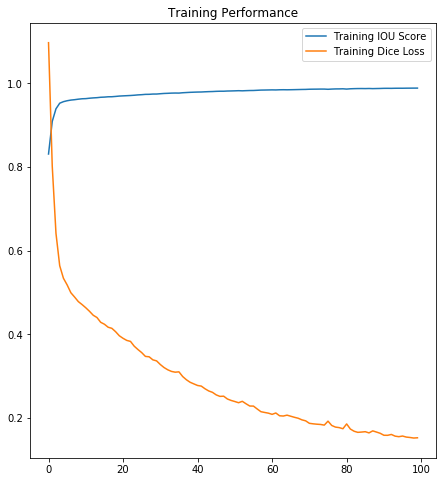

In [15]:
iou_score_result = history.history['iou_score']
loss_result = history.history['loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, iou_score_result, label='Training IOU Score')
plt.plot(epochs_range, loss_result, label='Training Dice Loss')
plt.legend(loc='upper right')
plt.title('Training Performance')

plt.show()

In [0]:
#model.save('/content/drive/My Drive/spacenet-data/unet_model_two.h5')

In [0]:
x_val = np.empty((len(validation_list), 325, 325, 8))
y_val = np.empty((len(validation_list), 325, 325, 1))
for i, image_name in enumerate(validation_list):
    image = rasterio.open(image_path_new + image_name).read()
    image = np.moveaxis(image, 0, 2)
    mask_name = image_name.replace("MS", "mask")
    mask_name = mask_name.replace("tif", "npy")
    mask = np.load(mask_path_new + mask_name)
    mask = mask.reshape(mask.shape[0], mask.shape[1], 1)
    mask = mask.astype(bool)

    x_val[i,], y_val[i, ] = image, mask

In [0]:
from keras.models import load_model
model = load_model(save_model_path, custom_objects={'bce_dice_loss': bce_dice_loss, 'iou_score' : iou_score})
predictions = model.predict(x_val)

In [0]:
def show_raster_mask(index):
    fig, (ax1, ax2, ax3) = plt.subplots(nrows = 1, ncols = 3, figsize = (15, 15))

    raster = rasterio.open(image_path_new + validation_list[index])
    ax1.imshow(raster.read(1), cmap = 'pink')
    ax1.set_title('Raster Image')
    ax2.imshow(predictions[index].reshape(325, 325))
    ax2.set_title('Predicted Mask')
    ax3.imshow(y_val[index].reshape(325, 325))
    ax3.set_title('Ground Truth')
    plt.show()

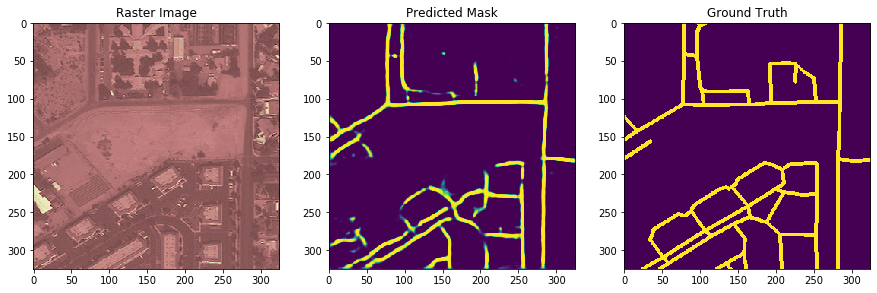

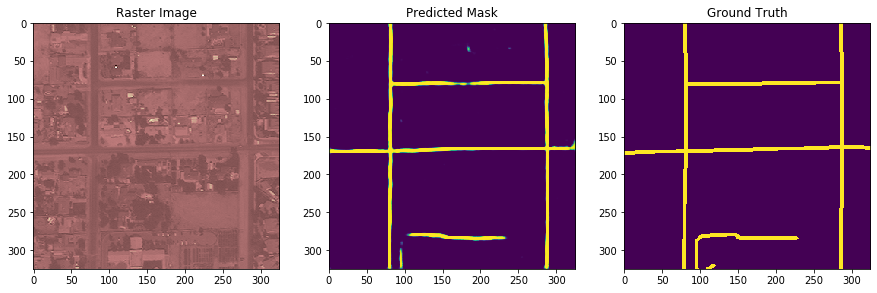

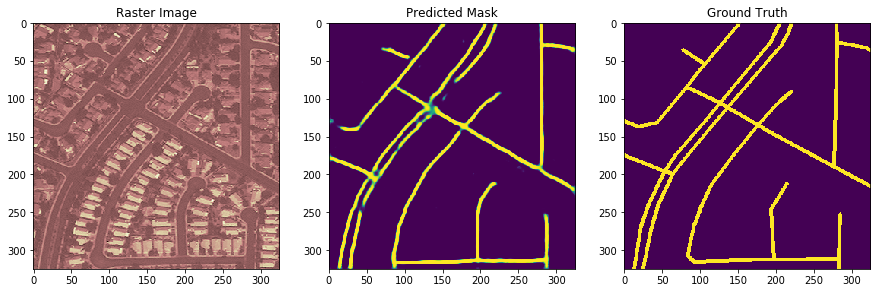

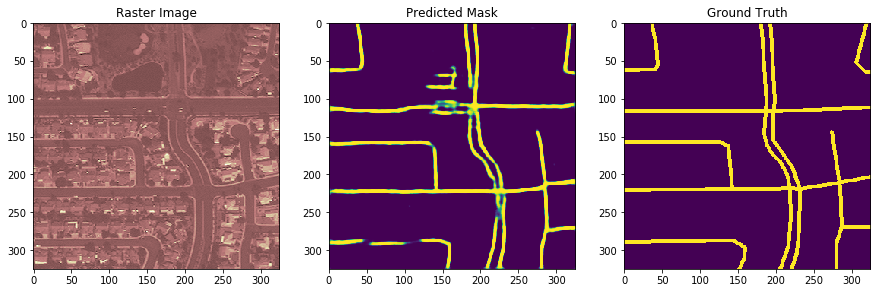

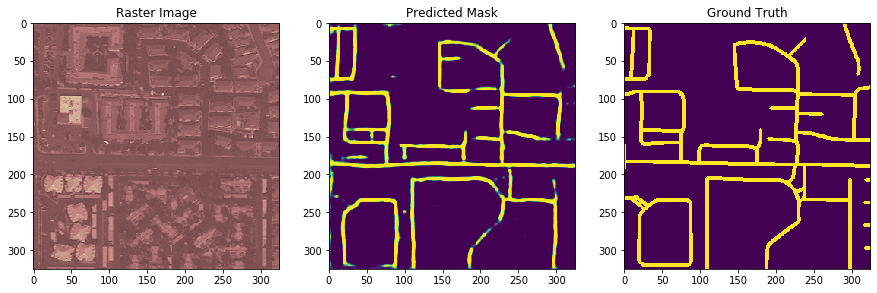

...

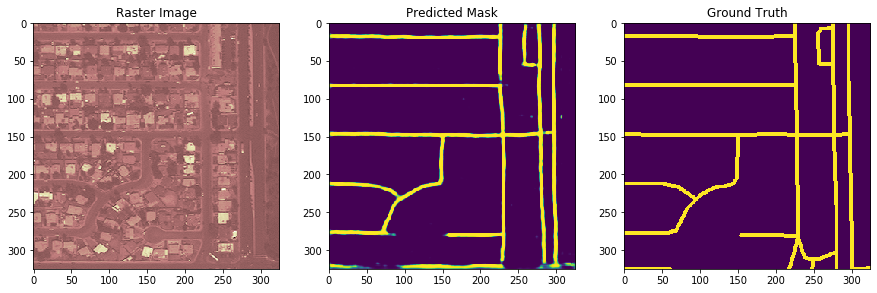

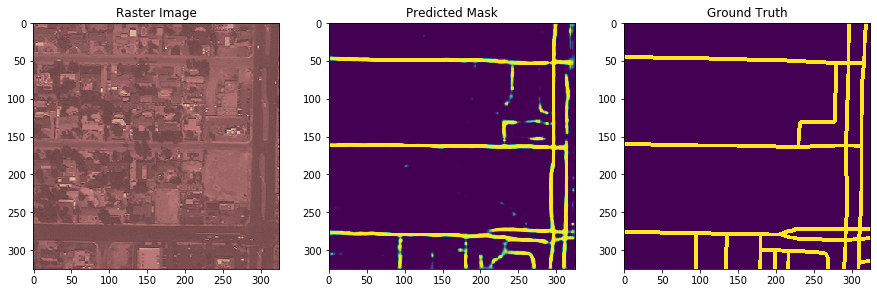

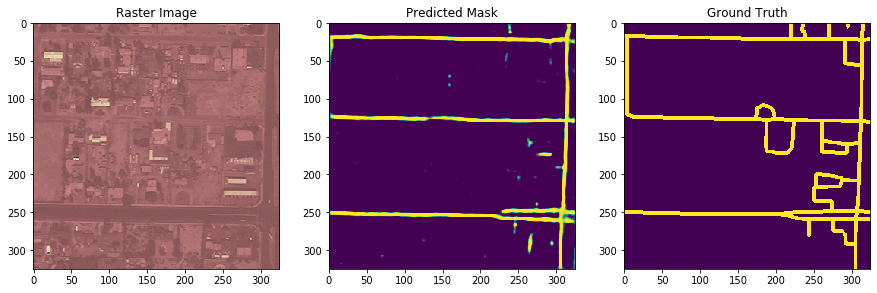

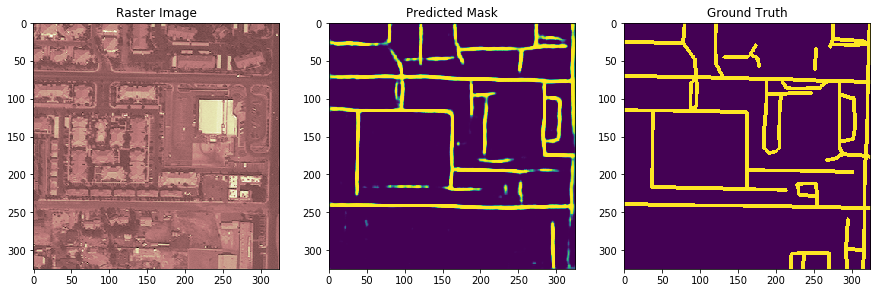

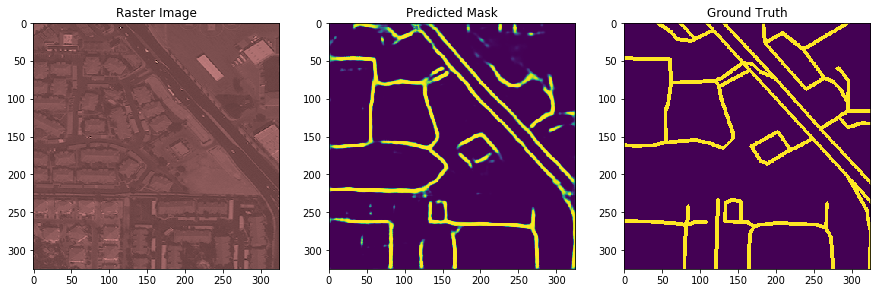

In [21]:
for i in range(80):
    show_raster_mask(i)